In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import make_regression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import LabelEncoder, LabelBinarizer, OrdinalEncoder, OneHotEncoder

# Apprentissage non supervisé

## K-Means Clustering

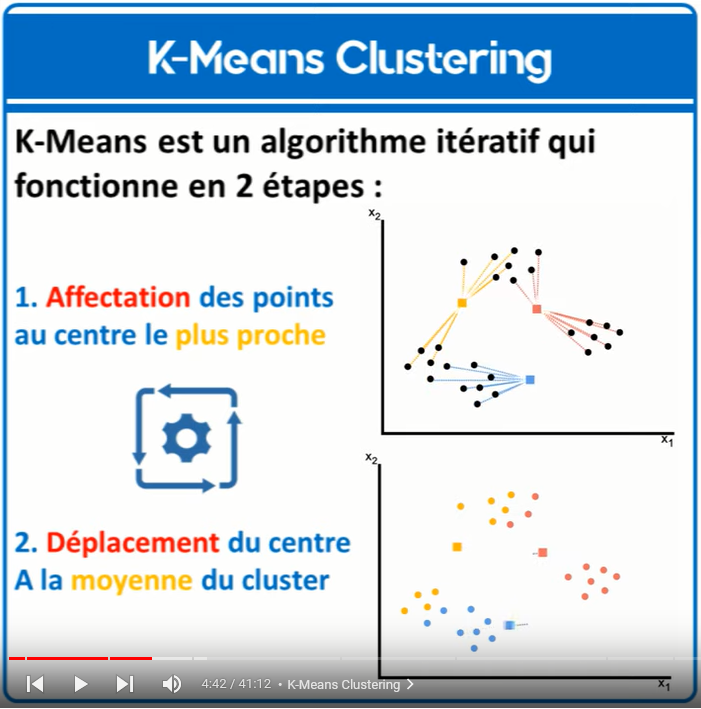

Si on veut créer 3 clusters, on va placer 3 centroids au hasard sur notre nuage de points, on va associer chaque point à son centroid le plus proche. les 3 clusters ont été crée.

On place ensuite les centroids au centre de leur cluster puis on renouvelle le processus, on associe chaque point à son centroid le plus proche.

On réitère jusqu'à ce qu'à atteindre une position d'équilibre, c'est à dire que la distance globale des points par rapport à leur centroid soit minimisée.

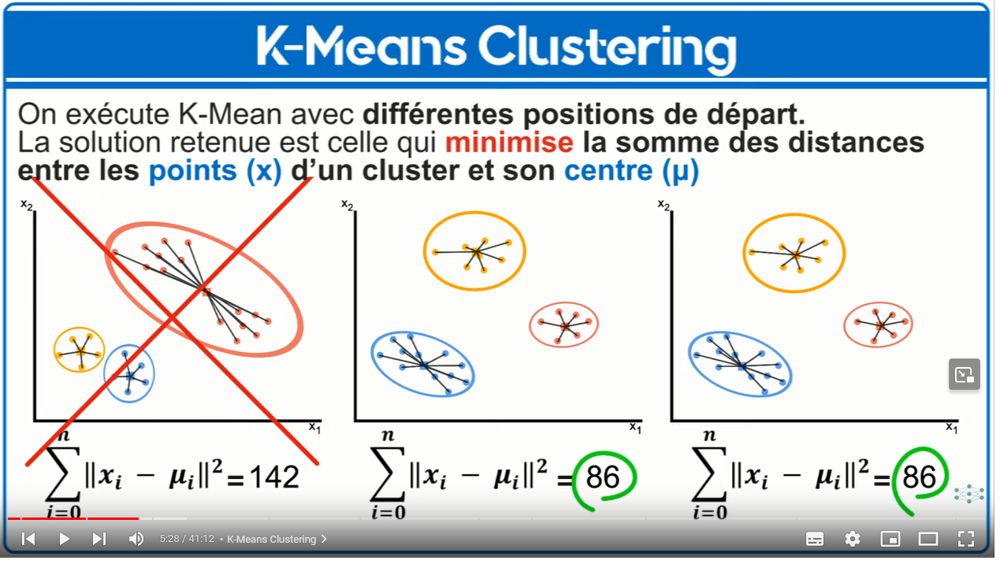

On lancera plusieurs modèle pour vérifier que l'inertia a bien été minimisée.

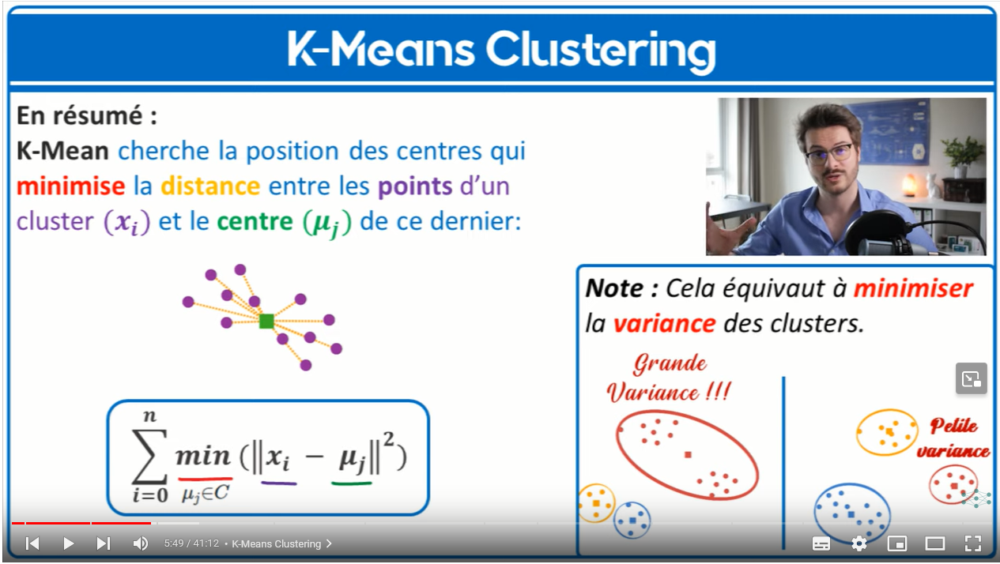

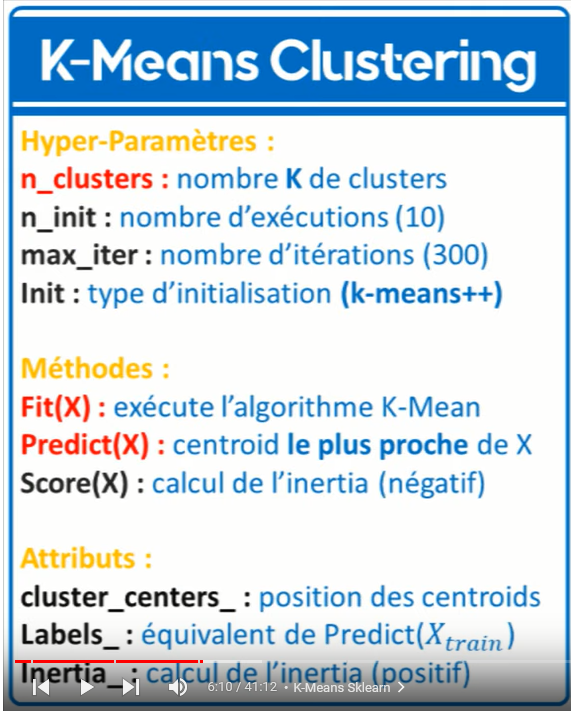

On cherche à minimiser l'inertia.

In [2]:
# pour générer des clusters
from sklearn.datasets import make_blobs

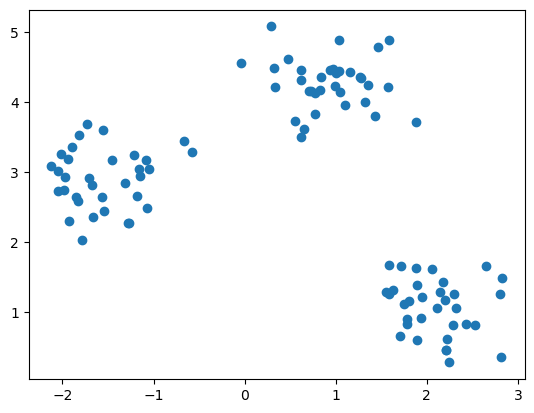

In [3]:
X, y = make_blobs(n_samples=100, centers=3, cluster_std=0.4, random_state=0)

plt.scatter(X[:,0], X[:,1])

In [4]:
from sklearn.cluster import KMeans

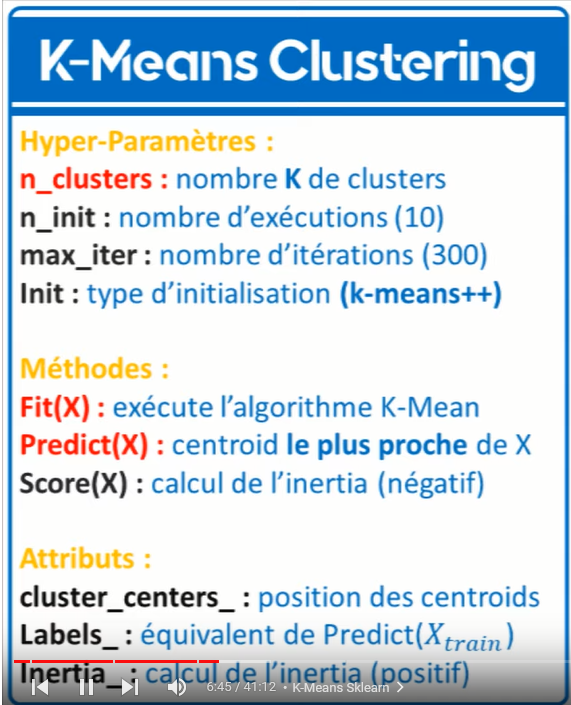

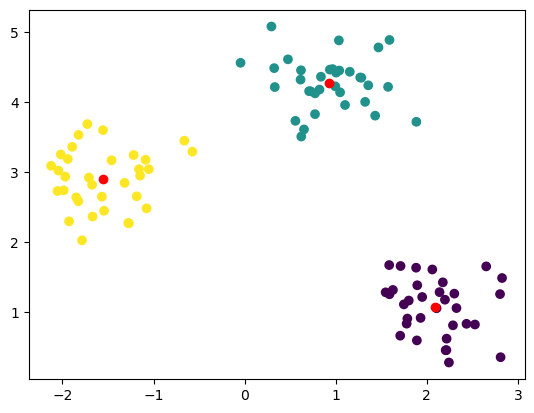

In [5]:
model = KMeans(n_clusters=3)

model.fit(X)

model.predict(X)

plt.scatter(X[:,0], X[:,1], c=model.predict(X))

# pour afficher les positions des centroids
model.cluster_centers_
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], c='r')

In [6]:
# calcul l'inertia, l'équivalent de la variance du cluster
model.score(X)

-30.870531280140675

### Elbow Method

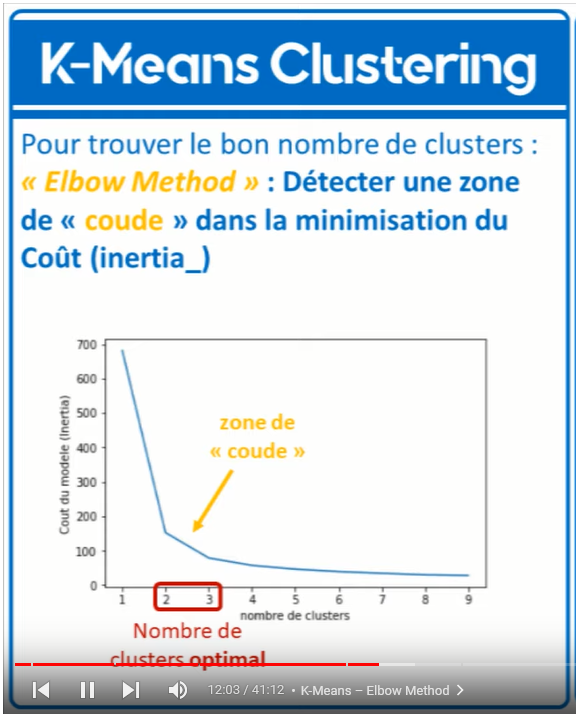

On créé un algorithme qui calcule l'inertia (la distance globale entre les points et leur centroid) en fonction du nombre de clusters puis on trace la courbe inertia en fonction du nombre de clusters.

Le but est de voir ensuite, le coude, le moment où l'inertia est minimisée de manière optimale.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Text(0, 0.5, 'Cout du modele (Inertia)')

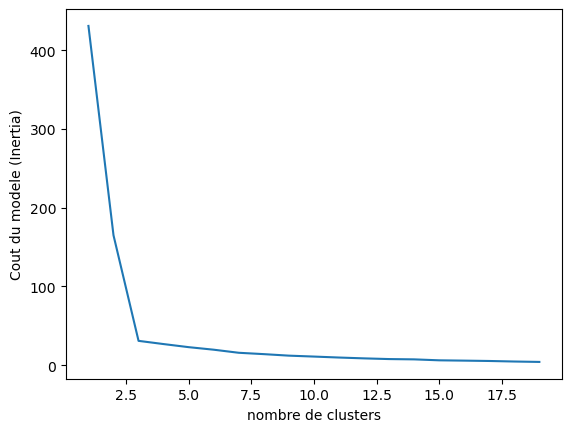

In [7]:
inertia = []
K_range = range(1, 20)
for k in K_range:
    model = KMeans(n_clusters=k).fit(X)
    inertia.append(model.inertia_)

plt.plot(K_range, inertia)
plt.xlabel('nombre de clusters')
plt.ylabel('Cout du modele (Inertia)')

On voit ici que le nombre optimale de clusters est 3, ensuite l'inertia n'est presque plus minimisée.

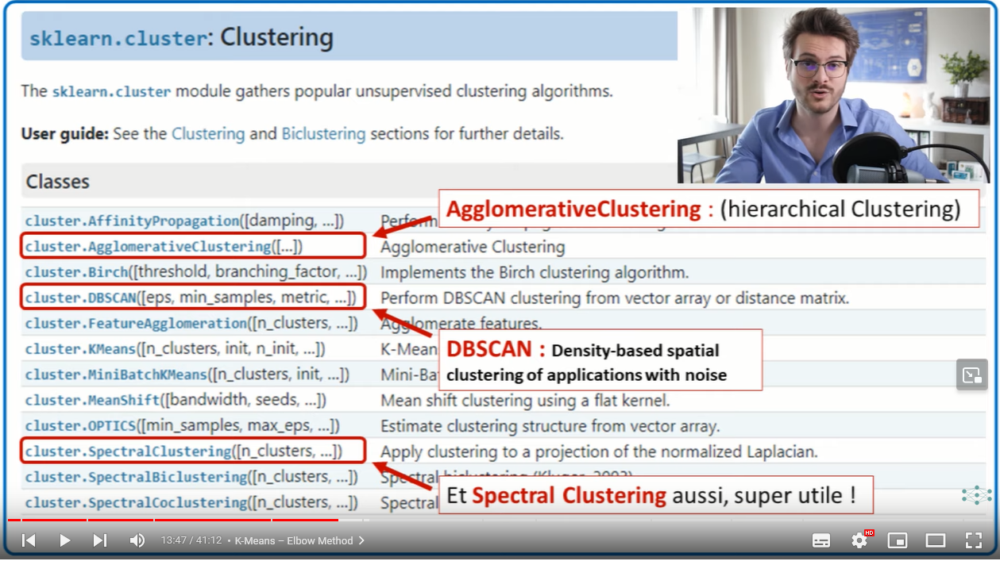

## Pour les détections d'anomalies

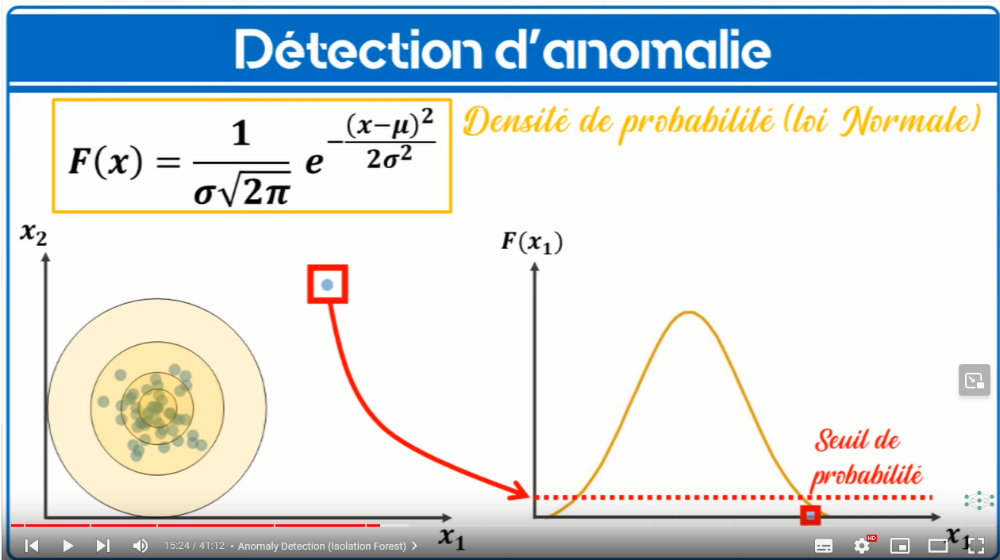

## Isolation Forest

L'IsolationForest permet d'isoler les anomalies dans un dataset, par exemple les outliers, en traçant des droites au hasard, dès qu'un point est isolé, on considère que c'est une anomalie. Les points situés dans des zones à forte densité ont une très faible probabilité d'être isolé tandis que les points seuls dans leur zone ont une forte probabilité d'être isolé rapidement (en un faible nombre de split).

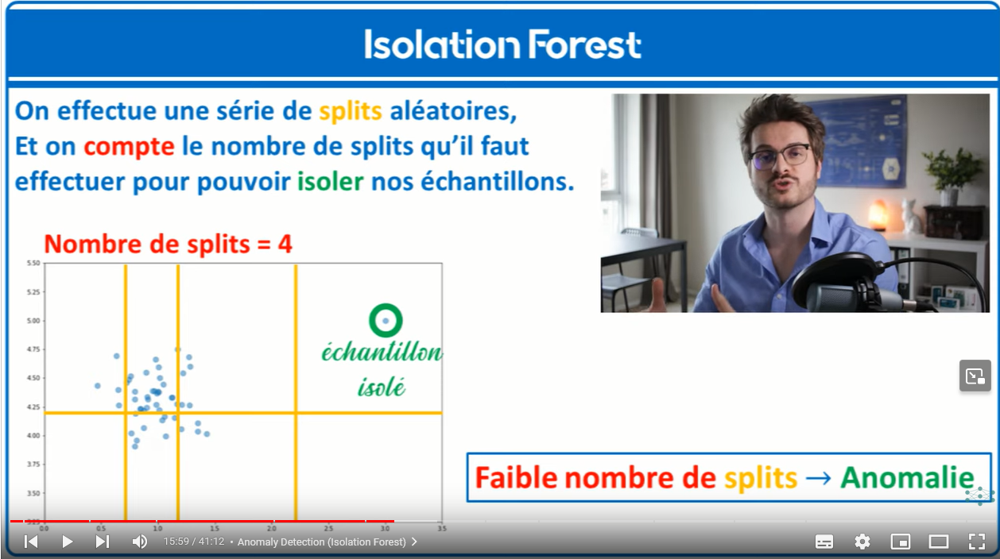

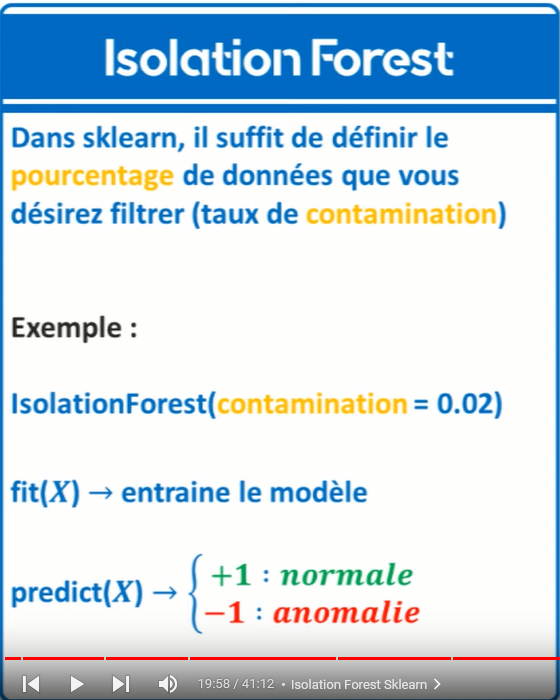

Hyperparamètre à définir : le taux de contamination, qui est le pourcentage de données à filtrer.

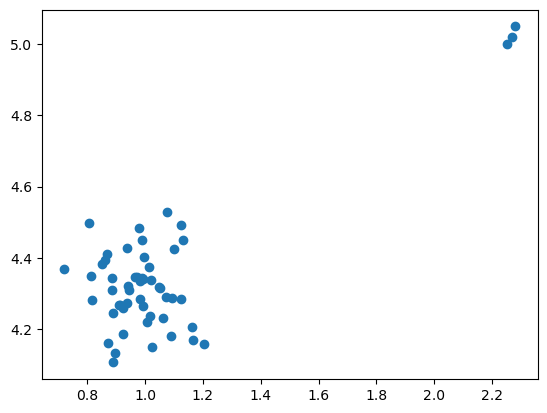

In [99]:
X, y = make_blobs(n_samples=50, centers=1, cluster_std=0.1, random_state=0)
X1=np.array([[2.25, 5],
            [2.27,5.02],
            [2.28, 5.05]])

X=np.concatenate((X,X1), axis=0)

plt.scatter(X[:,0], X[:,1])

In [100]:
from sklearn.ensemble import IsolationForest

In [105]:
model = IsolationForest(contamination=0.04)

model.fit(X)

model.predict(X)

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,
       -1, -1])

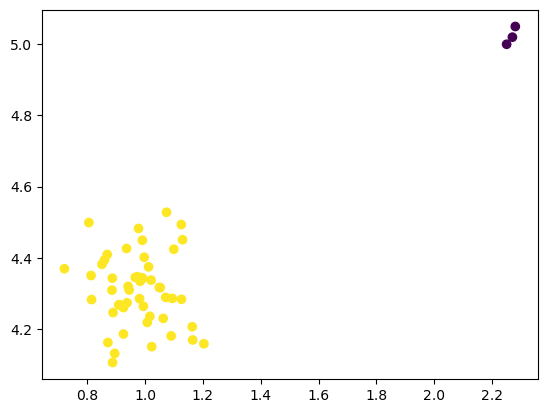

In [106]:
plt.scatter(X[:,0], X[:,1], c=model.predict(X))

Pour vérifier qu'on a bien isolé une anomalie, on effectuera un algorithme d'ensemble qui consiste à lancer plusieurs estimateurs en parallèle puis de croiser les résulats.

Ex : on lance 3 estimateurs d'IsolationForest dans un algo d'ensemble, 2 indique A et 1 indique B, on prendra donc la valeur A.

IsolationForest est un ensemble de générateur de type arbre de décison d'où son nom. Chaque split est un embranchement de cet arbre. On verra plus tard ce qu'est un arbre de décision en Machine Learning.

### Application dataset digit

Ce dataset est composé d'images représentant des nombre (X) avec un titre y indiquant le nombre en question. Le but va être de répertorier les anomalies, les chiffres représentés sur les images différemment des autres.

In [108]:
from sklearn.datasets import load_digits

digits = load_digits()
images = digits.images
X = digits.data
y = digits.target

print(X.shape)

(1797, 64)


Text(0.5, 1.0, '1')

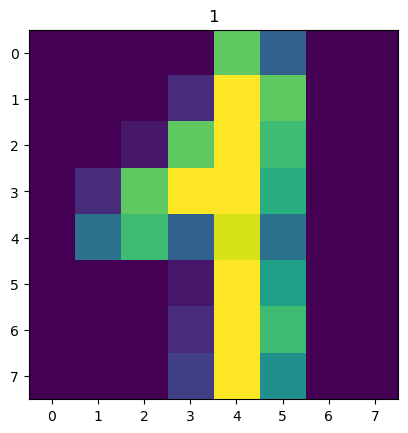

In [123]:
plt.imshow(images[42])
plt.title(y[42])

Note : la contamination est le pourcentage d'anomalies à rejeter.

In [111]:
model = IsolationForest(contamination=0.01)
model.fit(X)
# le modèle affecte 1 ou -1 à chaque image --> non anomalie ou anomalie
model.predict(X)

array([1, 1, 1, ..., 1, 1, 1])

In [117]:
# si model.predict == -1, l'image est un outliers, une anomalies par rapport aux autres images
outliers = model.predict(X) == -1
outliers

array([False, False, False, ..., False, False, False])

In [113]:
# les images "anomalies", représentés différemment des autres, structurées différement
# 18 images outliers
print(X[outliers].shape)
print(X[outliers])

(18, 64)
[[ 0.  6. 16. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  2. ...  0.  0.  0.]
 ...
 [ 0.  4. 15. ...  0.  0.  0.]
 [ 0.  7. 12. ...  0.  0.  0.]
 [ 0.  0.  0. ...  7.  0.  0.]]


Text(0.5, 1.0, '5')

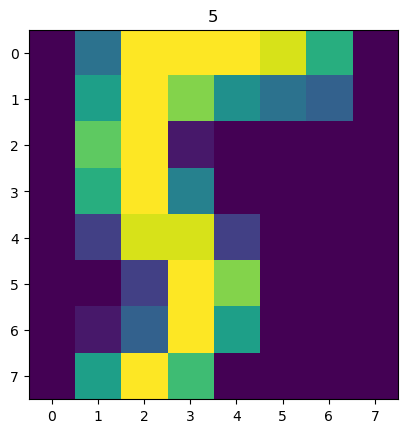

In [17]:
# on visualise une des 18 images outliers en plaçant le masque outliers dans images, le masque est un booléen de dimensions
# (1797,) , on peut l'associer à X, y et images car les 3 ont 1797 en première dimensions
plt.imshow(images[outliers][0])
plt.title(y[outliers][0])
# on voit au titre que c'est sensé être un 5, il est en effet un peu bizarre

Autre algorithme de détection d'anomalies :
Local Outlier Factor

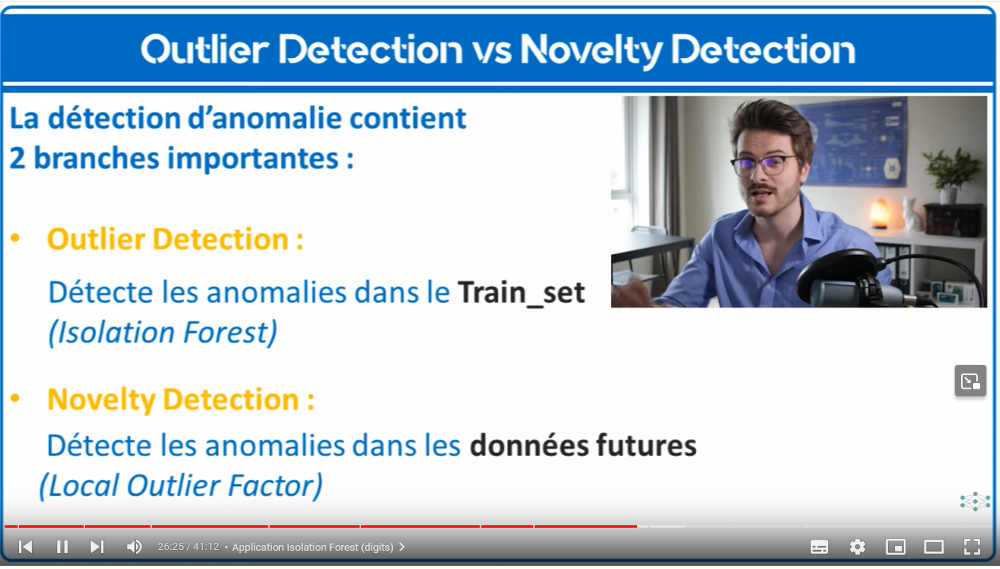

## Réduction de dimensions
Réduction des variables d'un dataset
## Analyse en composantes principales

L'enjeu principal de la réduction de dimensions est de conserver un maximum de variance ne réduisant au maximum les dimensions.

Voici le principe d'un point de vue mathématique :

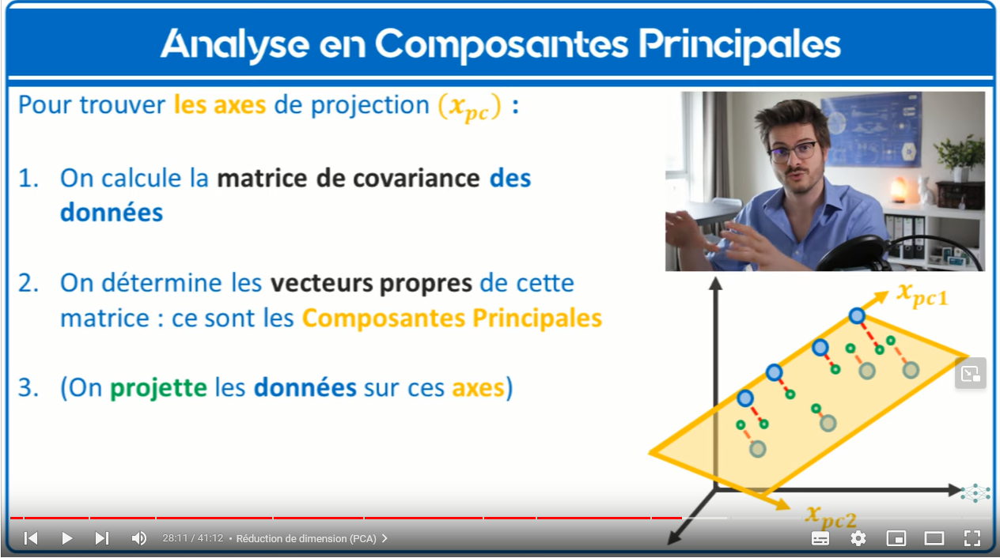

In [124]:
from sklearn.decomposition import PCA

In [125]:
from sklearn.datasets import load_digits

digits = load_digits()
images = digits.images
X = digits.data
y = digits.target

print(X.shape)

(1797, 64)


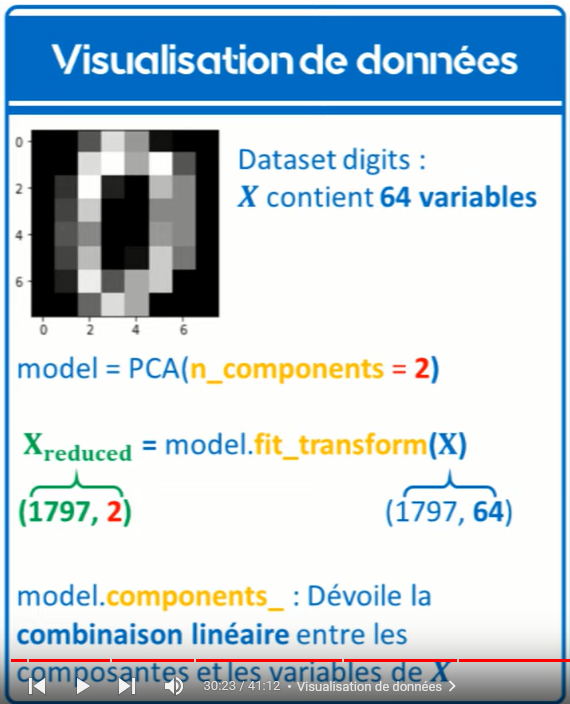

In [126]:
model = PCA(n_components=2)
X_reduced = model.fit_transform(X)

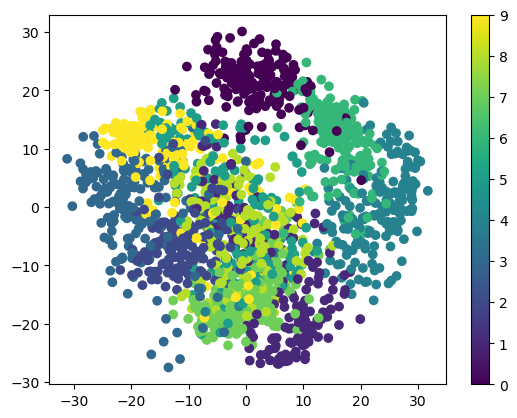

In [127]:
# on visualise nos chiffres dans l'espace par rapport à nos variables réduites à 2 dimensions
# on voit que chaque chiffre à sa zone, 7 et 2 proche, 9 et 3 proche car proche visuellement
plt.scatter(X_reduced[:,0], X_reduced[:,1], c=y)
plt.colorbar()

In [130]:
X_reduced.shape

(1797, 2)

In [36]:
# combinaison linéaire des 64 variables, ce qui signifie que chaque intersection des 2 vecteurs est la combinaison linéaire
# d'une des 64 variables
model.components_.shape

(2, 64)

In [136]:
model.components_

array([[ 0.00000000e+00, -1.73094588e-02, -2.23428795e-01,
        -1.35913321e-01, -3.30323555e-02, -9.66340296e-02,
        -8.32937449e-03,  2.26901054e-03, -3.20516879e-04,
        -1.19308915e-01, -2.44451681e-01,  1.48512756e-01,
        -4.67319705e-02, -2.17740762e-01, -1.48136242e-02,
         4.47779980e-03, -4.94138886e-05, -7.95419759e-02,
         8.33951595e-02,  2.15915403e-01, -1.72126816e-01,
        -1.63712127e-01,  2.86444561e-02,  4.23251713e-03,
         9.85487407e-05,  6.42318719e-02,  2.54093304e-01,
        -3.56770718e-02, -2.09462562e-01, -4.31311070e-02,
         5.13118585e-02,  2.13422732e-04,  0.00000000e+00,
         1.59950864e-01,  3.68690738e-01,  1.64406775e-01,
         8.52007734e-02,  3.72983471e-02,  2.15866963e-02,
         0.00000000e+00,  1.28865627e-03,  1.06945305e-01,
         3.03067480e-01,  2.47813086e-01,  2.09637296e-01,
         1.22325607e-02, -3.69458439e-02,  1.61485096e-03,
         6.93024090e-04, -8.35142182e-03, -5.58598321e-0

### Compression des données 

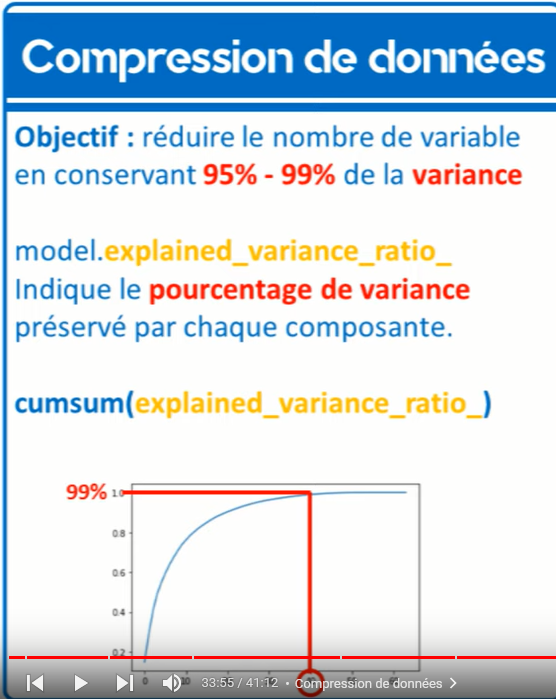

In [138]:
model = PCA(n_components=64)
X_reduced = model.fit_transform(X)
X_reduced

array([[-1.25946645e+00,  2.12748835e+01, -9.46305462e+00, ...,
        -0.00000000e+00, -0.00000000e+00,  4.46141155e-14],
       [ 7.95761130e+00, -2.07686990e+01,  4.43950604e+00, ...,
         9.46902519e-16,  1.78205727e-15,  1.67046393e-16],
       [ 6.99192297e+00, -9.95598641e+00,  2.95855808e+00, ...,
         6.15147994e-16,  8.39552521e-16,  1.16654252e-16],
       ...,
       [ 1.08012837e+01, -6.96025223e+00,  5.59955453e+00, ...,
         8.64286588e-17, -2.74288888e-16,  9.70809841e-17],
       [-4.87210009e+00,  1.24239536e+01, -1.01708664e+01, ...,
         1.11849658e-16, -2.84591224e-17, -1.23762878e-16],
       [-3.44389631e-01,  6.36554919e+00,  1.07737085e+01, ...,
        -1.16511365e-16, -9.63233138e-17,  2.70670966e-16]])

[1.48905936e-01 1.36187712e-01 1.17945938e-01 8.40997942e-02
 5.78241466e-02 4.91691032e-02 4.31598701e-02 3.66137258e-02
 3.35324810e-02 3.07880621e-02 2.37234084e-02 2.27269657e-02
 1.82186331e-02 1.77385494e-02 1.46710109e-02 1.40971560e-02
 1.31858920e-02 1.24813782e-02 1.01771796e-02 9.05617439e-03
 8.89538461e-03 7.97123157e-03 7.67493255e-03 7.22903569e-03
 6.95888851e-03 5.96081458e-03 5.75614688e-03 5.15157582e-03
 4.89539777e-03 4.28887968e-03 3.73606048e-03 3.53274223e-03
 3.36683986e-03 3.28029851e-03 3.08320884e-03 2.93778629e-03
 2.56588609e-03 2.27742397e-03 2.22277922e-03 2.11430393e-03
 1.89909062e-03 1.58652907e-03 1.51159934e-03 1.40578764e-03
 1.16622290e-03 1.07492521e-03 9.64053065e-04 7.74630271e-04
 5.57211553e-04 4.04330693e-04 2.09916327e-04 8.24797098e-05
 5.25149980e-05 5.05243719e-05 3.29961363e-05 1.24365445e-05
 7.04827911e-06 3.01432139e-06 1.06230800e-06 5.50074587e-07
 3.42905702e-07 9.50687638e-34 9.50687638e-34 9.36179501e-34]
[0.14890594 0.28509365 

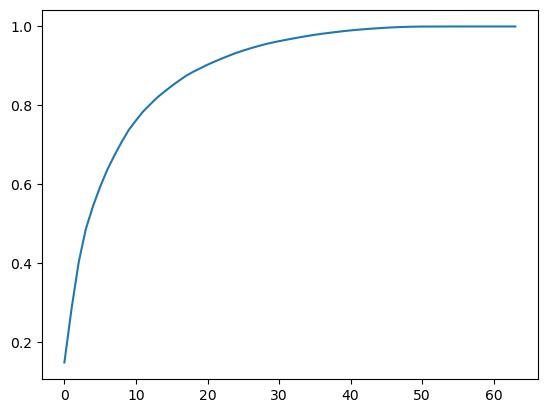

In [142]:
# pour connaitre le pourcentage de variance conservé par chaque variable
print(model.explained_variance_ratio_)
print(np.cumsum(model.explained_variance_ratio_))
plt.plot(np.cumsum(model.explained_variance_ratio_))

In [140]:
# cela signifie qu'en gardant les 40 premières variables (sur 60), on conservera 99% de la variance
# on veut garder les variables qui ont le plus de variance, qui vont avoir le plus d'impact sur la variable cible
np.argmax(np.cumsum(model.explained_variance_ratio_)>0.99)

40

In [58]:
model = PCA(n_components=40)
X_reduced = model.fit_transform(X)
X_reduced

array([[ -1.25946645,  21.27488348,  -9.46305462, ...,  -2.76372281,
          1.08890325,   0.20600096],
       [  7.9576113 , -20.76869896,   4.43950604, ...,   2.07379049,
         -0.23084551,   0.72235404],
       [  6.99192297,  -9.95598641,   2.95855808, ...,   0.03819161,
          1.10864004,   3.28518436],
       ...,
       [ 10.8012837 ,  -6.96025223,   5.59955453, ...,   1.13263452,
          0.37578682,  -0.98182996],
       [ -4.87210009,  12.42395362, -10.17086635, ...,  -0.13489303,
         -0.78943562,   0.59005345],
       [ -0.34438963,   6.36554919,  10.77370849, ...,   0.69195512,
         -1.00343847,   4.88385709]])

In [59]:
# pour décompresser la matrice compressée
X_recovered = model.inverse_transform(X_reduced)

Text(0.5, 1.0, '0')

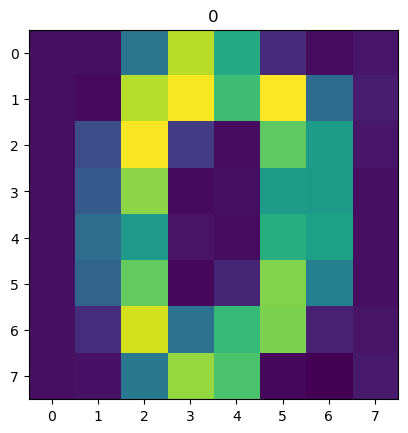

In [63]:
# visualisation d'une image décompressée
# on la redimensionne en 8x8, format image
plt.imshow(X_recovered[0].reshape((8,8)))
plt.title(y[0])

On peut directement affecter le pourcentage de variance qu'on veut concerver dans notre modèle

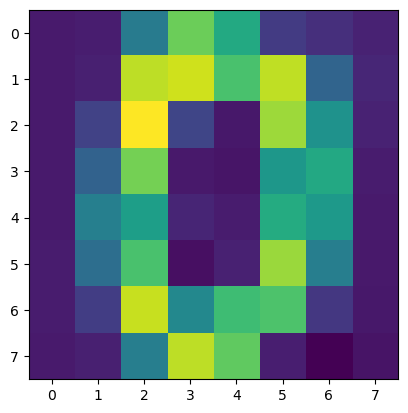

In [64]:
# ici on indique qu'on veut conserver 95% de la variance
model = PCA(n_components=0.95)
X_reduced = model.fit_transform(X)

# pour décompresser la matrice compressée
X_recovered = model.inverse_transform(X_reduced)

# visualisation d'une image décompressée
# on la redimensionne en 8x8, format image
plt.imshow(X_recovered[0].reshape((8,8)))

In [65]:
# nombre de composantes nécessaires pour atteindre 95% de variance
model.n_components_

29

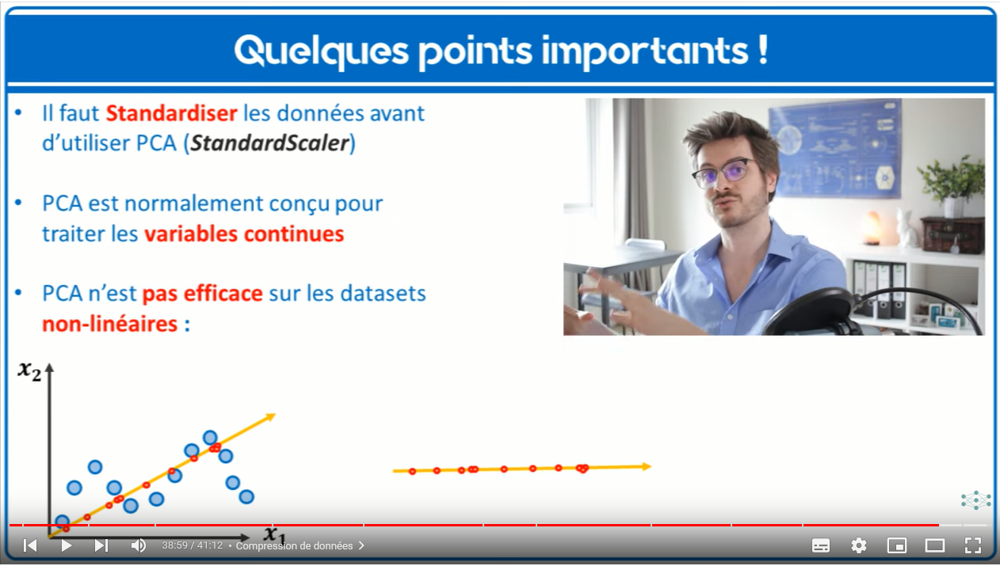

PCA pour des variables continues : normalement pas adapté à des données qui ont été encodées en OneHot

PCA pas efficace pour les datasets non linéaire : plutôt les techniques de Manifold Learning : IsoMap, T-SNE

# ENSEMBLE LEARNING : BAGGING, BOOSTING et STACKING (25/30)

L'ensemble learning consiste à créer un modèle composer de plusieurs algorithme de machine learning afin d'obtenir de meilleur résultat.

L'expression "Wisdom of the crown" signifie que l'association de plusieurs modèles sera meilleur qu'un seul.
Pour chaque prédiction, on va prendre la valeurs de la majorité des modèles.

Ex : si 3 modèles disent A et 1 modéle B on prédit A.

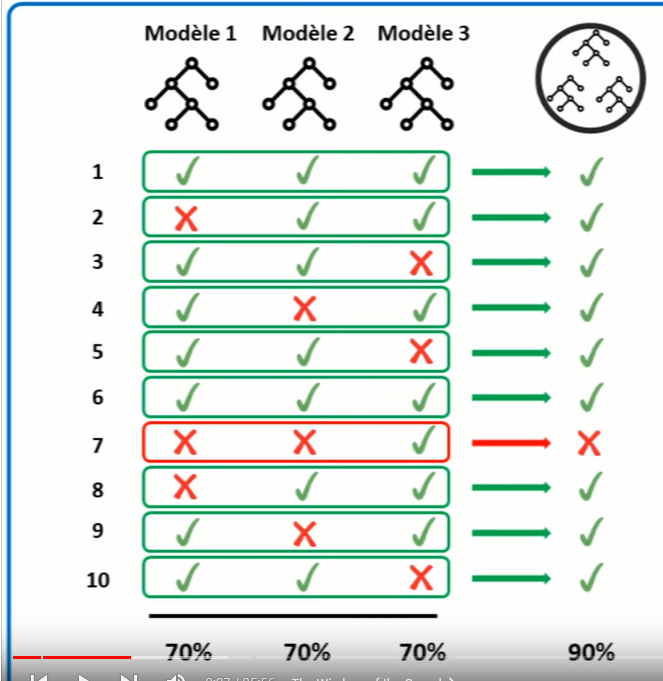

La loi des grands nombres indiquent que plus on a de modèle, plus le modèle d'ensemble va tendre vers 100% de bonnes réponses, dans le cas ou chaque modèle a plus de 50% de bonnes réponses.

Dans le cas contraire, le modèle d'ensemble tendra vers 0.

Les modèles doivent être diversifiés, ne pas toujours donner les mêmes réponses mais ne pas être complètement opposé non plus.

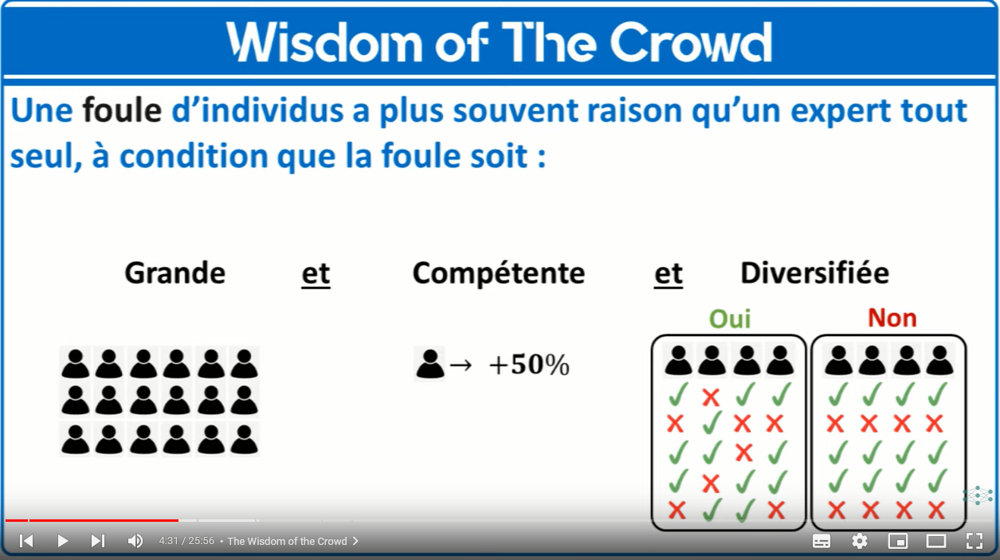

3 méthodes existent pour créer des modèles d'ensemble :
- Bagging
- Boosting
- Stacking

## Le Bagging

On créer plusieurs copie d'un même modèle et on l'entraine sur une portion aléatoire du dataset, avec des élements en commun et d'autres non.

On utilise le bootstrapping qui consiste à replacer les éléments utilisés pour le premier modèle lorsque qu'on créer le 2e.

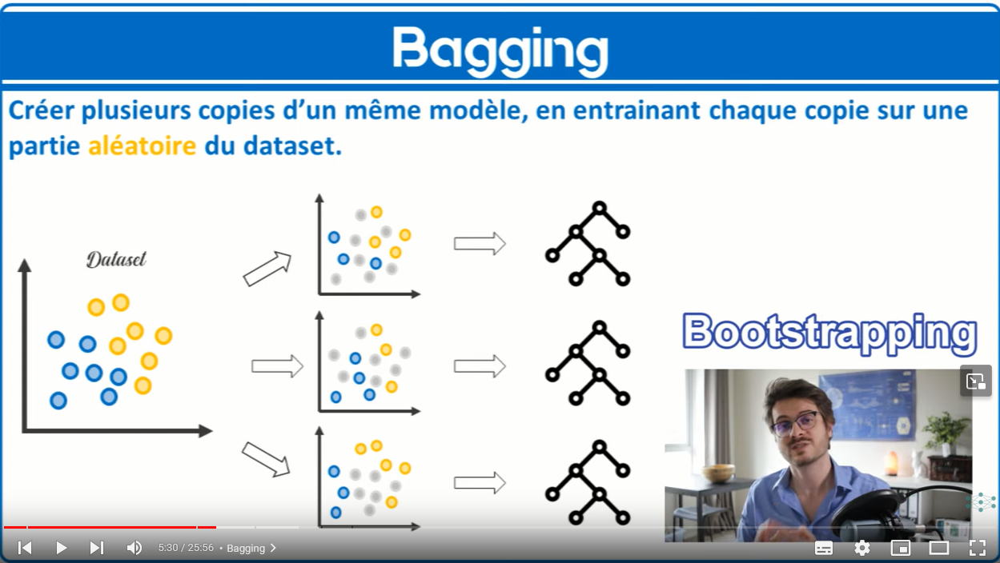

Le bootstrapping est important pour obtenir de meilleur résultat.

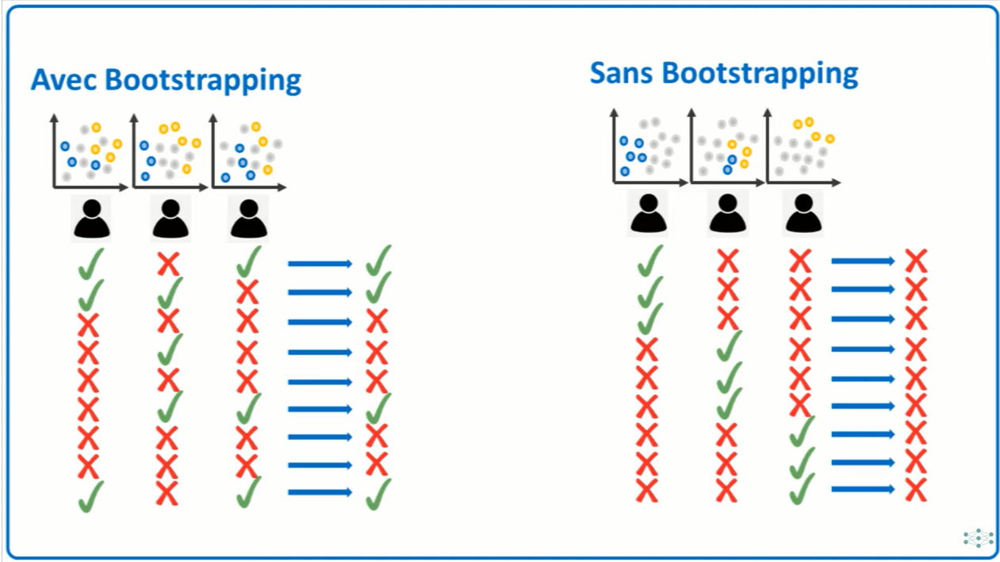

## Le Boosting 

Modèle composé de plusieurs algorithme assez faible, qui apprend du modèle précédents les erreurs et qui s'améliore à chaque modèle.

Les algorithmes les plus connu sont AdaBoost et Gradient Boosting.

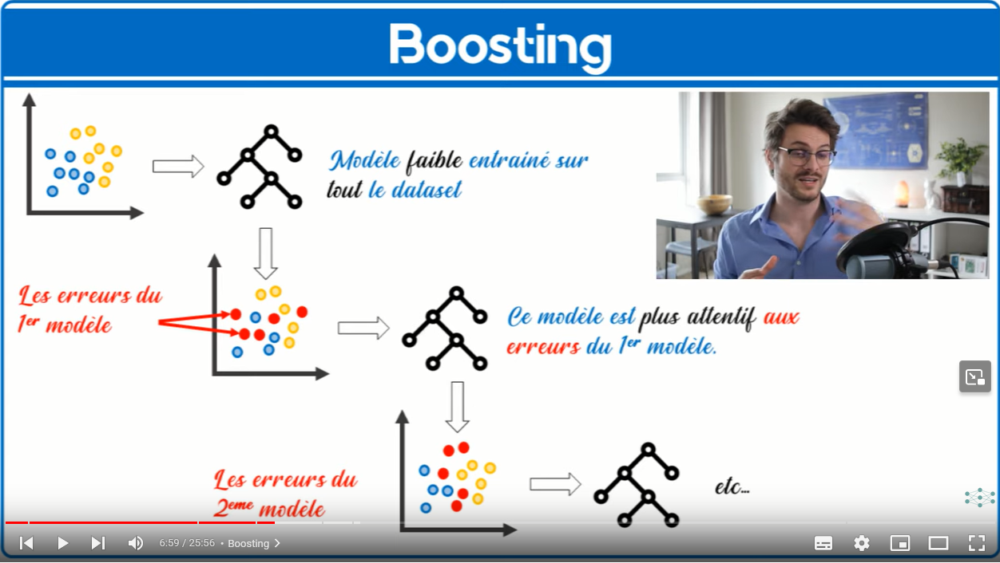

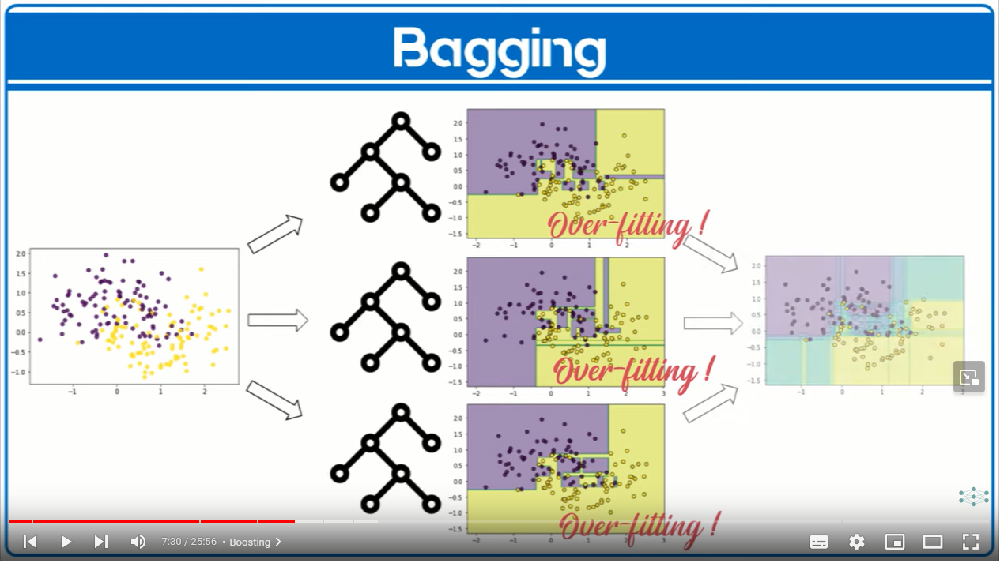

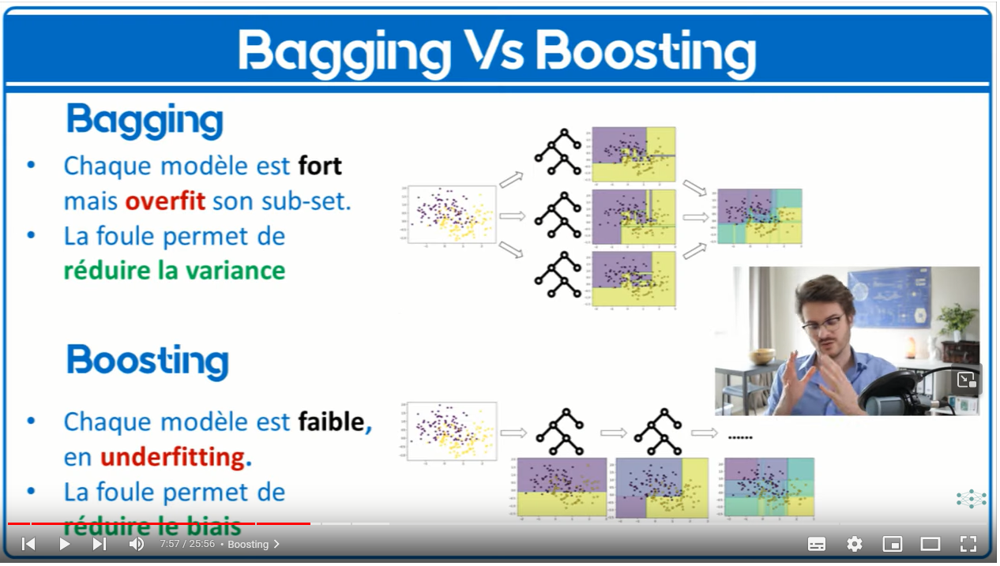

## Le Stacking

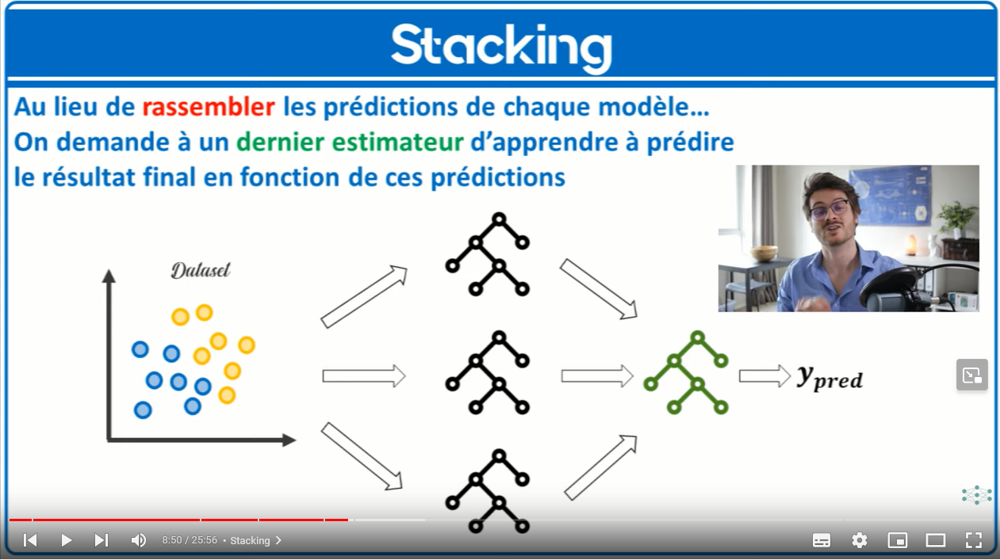

## Mise en pratique 

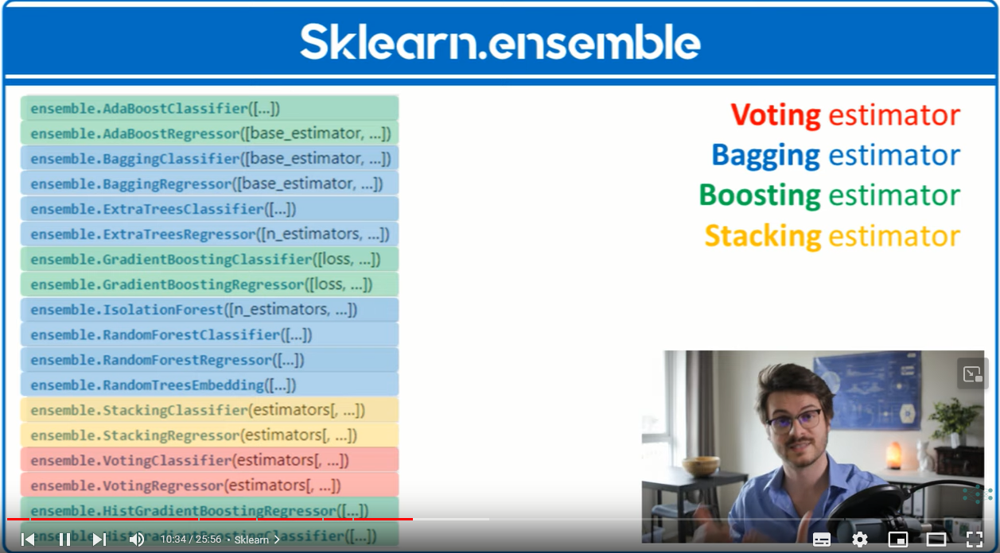

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

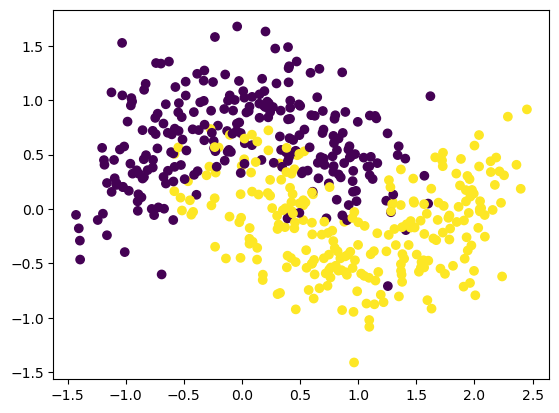

In [148]:
X, y = make_moons(n_samples=500, noise=0.3, random_state=0)
plt.scatter(X[:,0], X[:,1], c=y)

In [153]:
# test_size=0.3 signifie que 30% du dataset sont pour le test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

### Voting Classifier

In [167]:
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import VotingClassifier

In [174]:
model_1 = SGDClassifier(random_state=0)
model_2 = DecisionTreeClassifier(random_state=0)
model_3 = KNeighborsClassifier(n_neighbors=2)

model_4 = VotingClassifier([('SGD', model_1), ('Decision_Tree', model_2), ('KNeighbors', model_3)],
                          voting='hard')

print("Score des différents modèles :")

for model in (model_1, model_2, model_3, model_4):
    model.fit(X_train, y_train)
    print(model.__class__.__name__,':', model.score(X_test, y_test))
    
# la méthode d'ensemble est meilleur que chaque algo

Score des différents modèles :
SGDClassifier : 0.84
DecisionTreeClassifier : 0.86
KNeighborsClassifier : 0.86
VotingClassifier : 0.8733333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Explication de l'hyperparamètre voting dans VotingClassifier

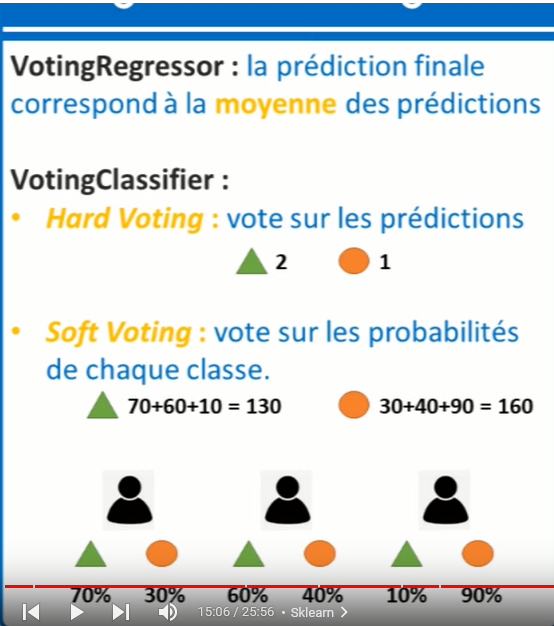

### Bagging

In [175]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

In [178]:
# on choisi le type d'estimateur et le nombre d'estimateurs
model = BaggingClassifier(base_estimator=KNeighborsClassifier(), n_estimators=100)

model.fit(X_train, y_train)

model.score(X_test, y_test)

0.8866666666666667

In [180]:
# on choisi le nombre d'estimateurs, il n'y a pas besoin de renseigner le type d'estimateurs car c'est un arbre
# de décision par défaut

model = RandomForestClassifier(n_estimators=100)

model.fit(X_train, y_train)

model.score(X_test, y_test)

0.8866666666666667

### Boosting

In [181]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

In [182]:
# de base arbre de décision comme estimateur
model = AdaBoostClassifier(n_estimators=100)

model.fit(X_train, y_train)

model.score(X_test, y_test)

0.88

In [183]:
model = GradientBoostingClassifier(n_estimators=100)

model.fit(X_train, y_train)

model.score(X_test, y_test)

0.8933333333333333

On utilisera GridSearchCV pour optimiser les hyperparamètres de chaque modèle

### Stacking

On créer un estimateur final à la suite de premiers estimateurs

In [184]:
from sklearn.ensemble import StackingClassifier

In [185]:
model_1 = SGDClassifier(random_state=0)
model_2 = DecisionTreeClassifier(random_state=0)
model_3 = KNeighborsClassifier(n_neighbors=2)

model_4 = StackingClassifier([('SGD', model_1), ('Decision_Tree', model_2), ('KNeighbors', model_3)],
                          final_estimator=KNeighborsClassifier(n_neighbors=2))

model.fit(X_train, y_train)

model.score(X_test, y_test)

0.8933333333333333

A chaque fois, les techniques d'ensemble obtiennent de meilleurs résultats que les algo seuls.

Bagging : 
On l'utilisera lorsque nos modèles singuliers feront de l'overfitting (surentrainement, l'algo répond parfaitement au trainset et beaucoup moins bien au testset, il généralise mal)

Boosting : 
Le modèle a du mal à avoir de bonnes performances sur le trainset.

Stacking : 
Quand un modèle a été très entrainé chacun de son côté, bonne solution mais le plus lent des trois.